In [3]:
import os
import warnings
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import set_matplotlib_formats
set_matplotlib_formats("retina")

import seaborn as sns
sns.set()
sns.set(rc={"figure.figsize": (14.7, 10.27)})

from plotly import tools
from plotly.offline import iplot
import plotly.graph_objs as go
import gc

from datetime import datetime
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric

/tmp/ipykernel_22342/2217005842.py:7: DeprecationWarning:

`set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`



In [4]:
file_to_get = "Coinbase_BTCUSD_1h.csv"
if not os.path.exists(file_to_get):
  !wget https://raw.githubusercontent.com/lilstipher/daily-cryptocurrencies-data/master/{file_to_get}
    
!ls -l

--2022-09-01 14:44:55--  https://raw.githubusercontent.com/lilstipher/daily-cryptocurrencies-data/master/Coinbase_BTCUSD_1h.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2499381 (2,4M) [text/plain]
Saving to: ‘Coinbase_BTCUSD_1h.csv’

Coinbase_BTCUSD_1h. 100%[===================>]   2,38M  10,2MB/s    in 0,2s    

2022-09-01 14:44:56 (10,2 MB/s) - ‘Coinbase_BTCUSD_1h.csv’ saved [2499381/2499381]

total 18448
-rw-rw-r-- 1 robin robin 16384582 sept.  1 14:36 bitcoin-prediction.ipynb
-rw-rw-r-- 1 robin robin  2499381 sept.  1 14:44 Coinbase_BTCUSD_1h.csv


In [5]:
bitcoin_usd_data = pd.read_csv(file_to_get, skiprows=[0])
bitcoin_usd_data.info()
bitcoin_usd_data.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29061 entries, 0 to 29060
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unix Timestamp  29061 non-null  float64
 1   Date            29061 non-null  object 
 2   Symbol          29061 non-null  object 
 3   Open            29061 non-null  float64
 4   High            29061 non-null  float64
 5   Low             29061 non-null  float64
 6   Close           29061 non-null  float64
 7   Volume BTC      29061 non-null  float64
 8   Volume USD      29061 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.0+ MB


,Unix Timestamp,Date,Symbol,Open,High,Low,Close,Volume BTC,Volume USD
3550,1.590743e+09,2020-05-29 09-AM,BTCUSD,9445.32,9475.58,9436.60,9445.00,350.30,3313222.20
6635,1.579637e+09,2020-01-21 08-PM,BTCUSD,8511.02,8710.61,8511.00,8705.79,1084.62,9388881.75
389,1.602122e+09,2020-10-08 02-AM,BTCUSD,10647.00,10647.00,10626.59,10642.38,159.20,1693324.52
24069,1.516874e+09,2018-01-25 10-AM,BTCUSD,11250.02,11355.79,11206.82,11254.99,148.67,1677729.56
16465,1.544249e+09,2018-12-08 06-AM,BTCUSD,3434.30,3439.90,3401.13,3423.03,386.97,1323140.04


In [6]:
bitcoin_usd_data["Datetime"] = bitcoin_usd_data["Unix Timestamp"].apply(lambda x: datetime.fromtimestamp(x))
bitcoin_usd_data

,Unix Timestamp,Date,Symbol,Open,High,Low,Close,Volume BTC,Volume USD,Datetime
0,1.603523e+09,2020-10-24 07-AM,BTCUSD,12965.84,12965.84,12953.20,12953.20,0.00,0.00,2020-10-24 09:00:00
1,1.603519e+09,2020-10-24 06-AM,BTCUSD,12979.28,12991.89,12961.03,12965.84,122.39,1587965.94,2020-10-24 08:00:00
2,1.603516e+09,2020-10-24 05-AM,BTCUSD,12981.77,12984.11,12947.58,12979.28,146.83,1904157.46,2020-10-24 07:00:00
3,1.603512e+09,2020-10-24 04-AM,BTCUSD,12983.84,13014.09,12970.48,12981.77,188.07,2443428.21,2020-10-24 06:00:00
4,1.603508e+09,2020-10-24 03-AM,BTCUSD,12998.90,13026.43,12972.18,12983.84,285.76,3715214.25,2020-10-24 05:00:00
...,...,...,...,...,...,...,...,...,...,...
29056,1.498921e+09,2017-07-01 03-PM,BTCUSD,2459.35,2475.00,2450.00,2467.83,276.82,682105.41,2017-07-01 17:00:00
29057,1.498918e+09,2017-07-01 02-PM,BTCUSD,2454.43,2473.93,2450.83,2459.35,289.42,712864.80,2017-07-01 16:00:00
29058,1.498914e+09,2017-07-01 01-PM,BTCUSD,2488.43,2488.43,2454.40,2454.43,280.28,693254.01,2017-07-01 15:00:00
29059,1.498910e+09,2017-07-01 12-PM,BTCUSD,2509.17,2512.87,2484.99,2488.43,157.36,393142.50,2017-07-01 14:00:00


In [7]:
fig = go.Figure(data=[go.Candlestick(x=bitcoin_usd_data["Datetime"],
                                     open=bitcoin_usd_data["Open"],
                                     high=bitcoin_usd_data["High"],
                                     low=bitcoin_usd_data["Low"],
                                     close=bitcoin_usd_data["Close"])])
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

In [8]:
# calc typical price indicator
bitcoin_usd_data["typical_price"] = (bitcoin_usd_data['Close'] +
                                     bitcoin_usd_data['High'] +
                                     bitcoin_usd_data['Low'])/3

In [9]:
g1 = go.Scatter(x=bitcoin_usd_data["Datetime"],
                y=bitcoin_usd_data["Open"],
                mode="lines",
                name="Open")

g2 = go.Scatter(x=bitcoin_usd_data["Datetime"],
                y=bitcoin_usd_data["Close"],
                mode="lines",
                name="Close")

g3 = go.Scatter(x=bitcoin_usd_data["Datetime"],
                y=bitcoin_usd_data["typical_price"],
                mode="lines",
                name="typical_price")

layout = {"title": "Historical Bitcoin Prices By hour (2017-2020)",
          "xaxis": {"rangeslider": {"visible": True},
                    "type": "date"}}

fig = {"data": [g1, g2, g3], "layout": layout}
iplot(fig)

In [10]:
# use prophet
# format data for prophet
df_model = bitcoin_usd_data.copy()
df_model = df_model[["Datetime", "typical_price"]]
df_model = df_model.rename(columns={"Datetime": "ds", "typical_price": "y"})
df_model

,ds,y
0,2020-10-24 09:00:00,12957.413333
1,2020-10-24 08:00:00,12972.920000
2,2020-10-24 07:00:00,12970.323333
3,2020-10-24 06:00:00,12988.780000
4,2020-10-24 05:00:00,12994.150000
...,...,...
29056,2017-07-01 17:00:00,2464.276667
29057,2017-07-01 16:00:00,2461.370000
29058,2017-07-01 15:00:00,2465.753333
29059,2017-07-01 14:00:00,2495.430000


In [11]:
model = Prophet()
model.fit(df_model)

14:45:25 - cmdstanpy - INFO - Chain [1] start processing
14:45:57 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
period_in_hours = 24*30
future = model.make_future_dataframe(periods=period_in_hours, freq="H")
forecast = model.predict(df=future)

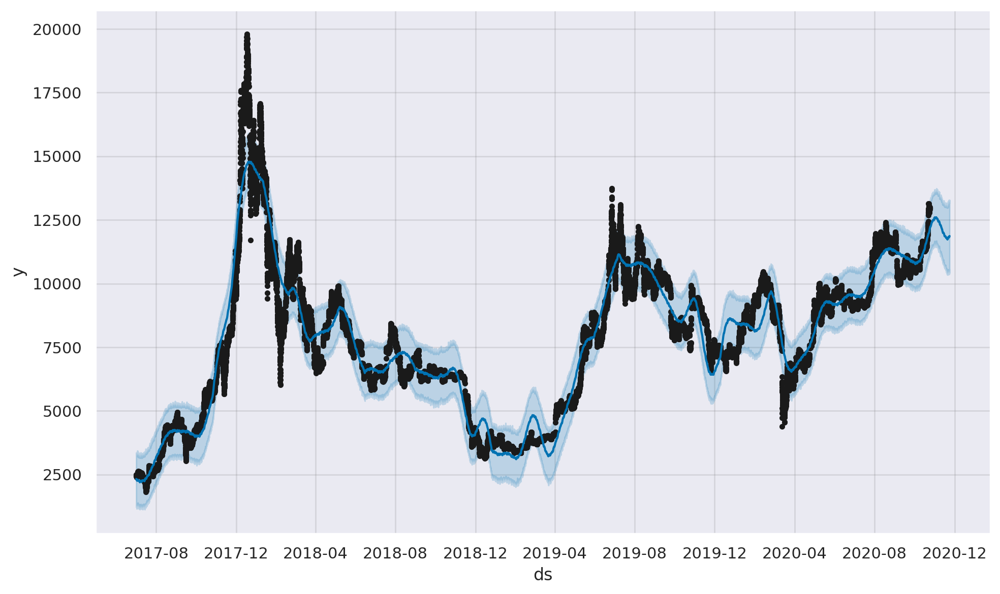

In [17]:
_ = model.plot(forecast)

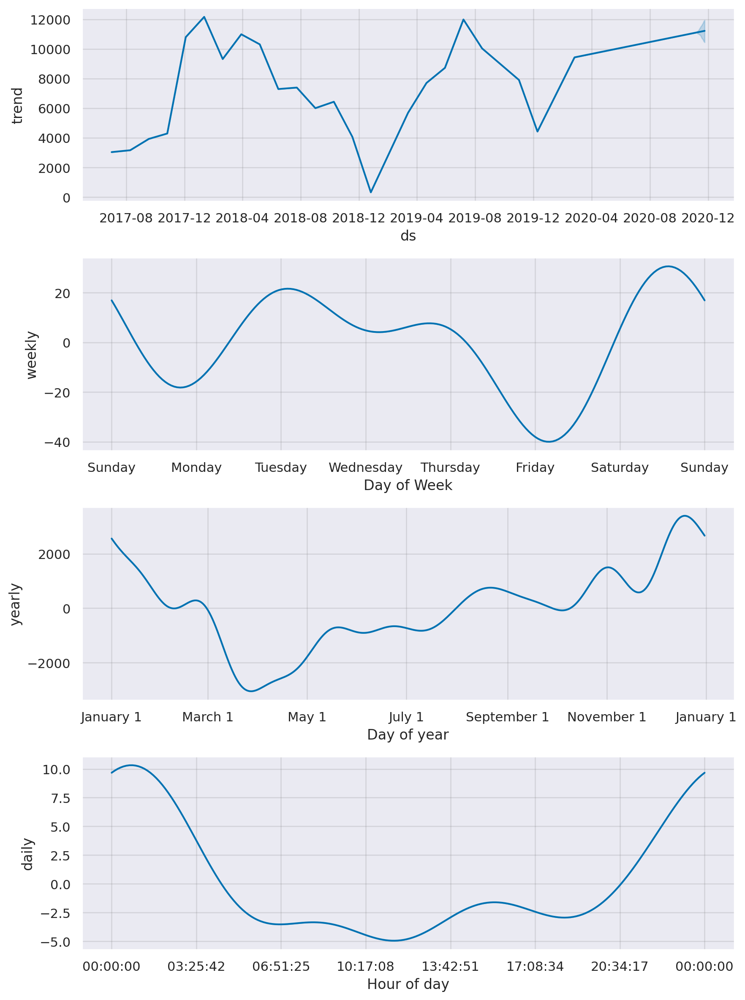

In [21]:
_ = model.plot_components(forecast)

In [25]:
# cross validation
cross_validation_df = cross_validation(model, initial="366 days", period="90 days", horizon="90 days")

  0%|          | 0/9 [00:00<?, ?it/s]

14:55:02 - cmdstanpy - INFO - Chain [1] start processing
14:55:09 - cmdstanpy - INFO - Chain [1] done processing
14:55:11 - cmdstanpy - INFO - Chain [1] start processing
14:55:16 - cmdstanpy - INFO - Chain [1] done processing
14:55:18 - cmdstanpy - INFO - Chain [1] start processing
14:55:35 - cmdstanpy - INFO - Chain [1] done processing
14:55:37 - cmdstanpy - INFO - Chain [1] start processing
14:55:52 - cmdstanpy - INFO - Chain [1] done processing
14:55:54 - cmdstanpy - INFO - Chain [1] start processing
14:56:32 - cmdstanpy - INFO - Chain [1] done processing
14:56:34 - cmdstanpy - INFO - Chain [1] start processing
14:57:03 - cmdstanpy - INFO - Chain [1] done processing
14:57:05 - cmdstanpy - INFO - Chain [1] start processing
14:57:46 - cmdstanpy - INFO - Chain [1] done processing
14:57:48 - cmdstanpy - INFO - Chain [1] start processing
14:58:20 - cmdstanpy - INFO - Chain [1] done processing
14:58:22 - cmdstanpy - INFO - Chain [1] start processing
14:58:56 - cmdstanpy - INFO - Chain [1]

In [26]:
cross_validation_df.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2018-08-06 10:00:00,7689.670860,6951.622786,8377.968504,6977.953333,2018-08-06 09:00:00
1,2018-08-06 11:00:00,7691.424070,7005.479330,8422.919259,6971.900000,2018-08-06 09:00:00
2,2018-08-06 12:00:00,7695.010464,6956.906975,8356.859465,6971.253333,2018-08-06 09:00:00
3,2018-08-06 13:00:00,7699.938151,7009.346899,8377.065280,6965.000000,2018-08-06 09:00:00
4,2018-08-06 14:00:00,7704.305139,7006.552051,8404.823789,6969.093333,2018-08-06 09:00:00


In [27]:
performance_metrics_df = performance_metrics(cross_validation_df)

In [28]:
performance_metrics_df.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,9 days 00:00:00,1.620727e+06,1273.077872,1072.172066,0.130750,0.110597,0.137803,0.387860
1,9 days 01:00:00,1.633475e+06,1278.074566,1077.167334,0.131349,0.110887,0.138481,0.384774
2,9 days 02:00:00,1.646377e+06,1283.112084,1082.212800,0.131953,0.111150,0.139163,0.382716
3,9 days 03:00:00,1.659027e+06,1288.032058,1087.242936,0.132563,0.111538,0.139848,0.379630
4,9 days 04:00:00,1.670454e+06,1292.460550,1092.006890,0.133155,0.111982,0.140508,0.377058


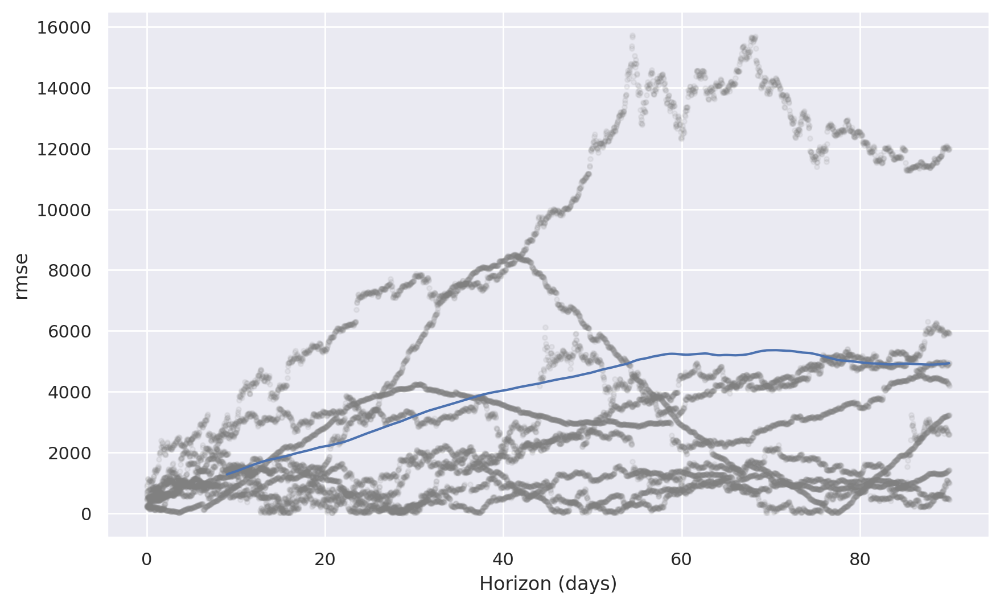

In [29]:
_ = plot_cross_validation_metric(cross_validation_df, metric="rmse")